#Leia antes de executar o programa

Para que a execução do programa ocorra da forma correta, deve-se seguir o seguinte passo-a-passo:
1. Descompactar a pasta `dataset-desafio`
2. Adicionar o arquivo do colab na pasta `dataset-desafio`
3. adicionar a pasta `dataset-desafio` ao google drive, dentro da pasta:
  - gdrive/MyDrive/Colab Notebooks
4. Dentro da pasta `detaset-desafio`terá uma pasta chamada `dataset-desafio-MEduarda` que vai conter todos os resultados apresentados quando o programa foi rodado por mim, como por exemplo, as imagens geradas pelo augmentation, dentro de suas respectivas pastas e os checkpoints salvos.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/MyDrive/Colab Notebooks/dataset-desafio

!ls

/content/gdrive/MyDrive/Colab Notebooks/dataset-desafio
atividade_06_maria_eduarda_neves.ipynb	damaged  Desafio.pdf  intact  interpretabilidade


#Compreendendo banco de dados:

- TREINAMENTO: Pastas de DAMAGE e INTACT (360 img)
  - Damage -> 180 img / 90 side; 90 top
  - Intact -> 180 img / 90 side; 90 top
- TESTE: PASTA DE INTERPRETABILIDADE (40 img)
  - Damage -> 20 img and 20 .xml/ 10 side; 10 top
  - Intact -> 20 img and 20 .xml/ 10 side; 10 top

##Organização das pastas de treinamento e teste

In [ ]:
from pathlib import Path
import os

caminho_projeto = Path()
print(caminho_projeto)

def create_folders_training_test(training_test):

  angulo_img = ['side','top']

  for indice in range(len(angulo_img)):
    dir_complete = caminho_projeto / f'{training_test}/{angulo_img[indice]}'
    dir_complete_damage = dir_complete / 'damage'
    dir_complete_intact = dir_complete / 'intact'

    if indice == 0:
      os.makedirs(dir_complete, exist_ok=True)
    else:
      dir_complete.mkdir(exist_ok=True)

    dir_complete_damage.mkdir(exist_ok=True)
    dir_complete_intact.mkdir(exist_ok=True)

.


In [ ]:
create_folders_training_test('training')
create_folders_training_test('test')

In [ ]:
def copiar_arquivos_jpg(caminho_original,novo_caminho):
  for root, dirs, files in os.walk(caminho_original):
    for file in files:
      if file[-1] == 'g': #copiar somente os arquivos de extensão '.jpg'
        caminho_arquivo = os.path.join(root,file)
        caminho_novo_arquivo = os.path.join(novo_caminho,file)
        if os.path.exists(f'{novo_caminho}/{file}') == False:
          shutil.copy2(caminho_arquivo,caminho_novo_arquivo)

def listar_arquivos_pasta(caminho_pasta):
  lista = []
  for root,dirs, files in os.walk(caminho_pasta):
    for file in files:
      lista.append(file)
  return lista

In [ ]:
import shutil

#ORIGINAL FOLDERS
damage_training_top_original_dir = caminho_projeto / 'damaged/top'
intact_training_top_original_dir = caminho_projeto / 'intact/top'

damage_training_side_original_dir = caminho_projeto / 'damaged/side'
intact_training_side_original_dir = caminho_projeto / 'intact/side'

damage_test_top_original_dir = caminho_projeto / 'interpretabilidade/damaged/top'
intact_test_top_original_dir = caminho_projeto / 'interpretabilidade/intact/top'

damage_test_side_original_dir = caminho_projeto / 'interpretabilidade/damaged/side'
intact_test_side_original_dir = caminho_projeto / 'interpretabilidade/intact/side'

#NEW FOLDERS
training_side_damage = caminho_projeto / 'training/side/damage'
training_side_intact = caminho_projeto / 'training/side/intact'

training_top_damage = caminho_projeto / 'training/top/damage'
training_top_intact = caminho_projeto / 'training/top/intact'

training_paths = [training_top_damage,training_top_intact,training_side_damage,training_side_intact]

test_side_damage = caminho_projeto / 'test/side/damage'
test_side_intact = caminho_projeto / 'test/side/intact'

test_top_damage = caminho_projeto / 'test/top/damage'
test_top_intact = caminho_projeto / 'test/top/intact'

#COPY FILES
#TRAINING
copiar_arquivos_jpg(damage_training_top_original_dir,training_top_damage)
copiar_arquivos_jpg(intact_training_top_original_dir,training_top_intact)
copiar_arquivos_jpg(damage_training_side_original_dir,training_side_damage)
copiar_arquivos_jpg(intact_training_side_original_dir,training_side_intact)
#TEST
copiar_arquivos_jpg(damage_test_top_original_dir,test_top_damage)
copiar_arquivos_jpg(intact_test_top_original_dir,test_top_intact)
copiar_arquivos_jpg(damage_test_side_original_dir,test_side_damage)
copiar_arquivos_jpg(intact_test_side_original_dir,test_side_intact)




In [ ]:
#LIMPAR ARQUIVOS EXTRAS DA PASTA DE TRAINING, CASO EXISTAM
for path in training_paths:
  arquivos = os.listdir(path)
  for arquivo in arquivos:
    path_img = path / arquivo
    if 'augmentation' in arquivo:
      os.remove(path_img)

In [ ]:
#TRAINING
lista_training_damage_top = listar_arquivos_pasta(training_top_damage)
lista_training_intact_top = listar_arquivos_pasta(training_top_intact)

lista_training_damage_side = listar_arquivos_pasta(training_side_damage)
lista_training_intact_side = listar_arquivos_pasta(training_side_intact)

#TEST
lista_test_damage_top = listar_arquivos_pasta(test_top_damage)
lista_test_intact_top = listar_arquivos_pasta(test_top_intact)

lista_test_damage_side = listar_arquivos_pasta(test_side_damage)
lista_test_intact_side = listar_arquivos_pasta(test_side_intact)

In [ ]:
print(f'Qnt de arquivos na pasta damage TOP completa (training): {len(lista_training_damage_top)}.')
print(f'Lista damage completa: {lista_training_damage_top}')
print()
print(f'Qnt de arquivos na pasta intact TOP completa (training): {len(lista_training_intact_top)}.')
print(f'Lista intact completa: {lista_training_intact_top}')
print()
print(f'Qnt de arquivos na pasta damage SIDE completa (training): {len(lista_training_damage_side)}.')
print(f'Lista damage completa: {lista_training_damage_side}')
print()
print(f'Qnt de arquivos na pasta intact SIDE completa (training): {len(lista_training_intact_side)}.')
print(f'Lista intact completa: {lista_training_intact_side}')

Qnt de arquivos na pasta damage TOP completa (training): 90.
Lista damage completa: ['0229909175324_top.png', '0386316000696_top.png', '0335828260045_top.png', '0197052530143_top.png', '0387573503409_top.png', '0198998397732_top.png', '0235293872824_top.png', '0398017513292_top.png', '0388563298350_top.png', '0185507921789_top.png', '0286652036220_top.png', '0448437998906_top.png', '0327176937261_top.png', '0345344588281_top.png', '0365721190881_top.png', '0445579724899_top.png', '0205275090120_top.png', '0287177509968_top.png', '0399648700926_top.png', '0274769934484_top.png', '0445725542185_top.png', '0360545482431_top.png', '0205031618492_top.png', '0420449336143_top.png', '0280138651335_top.png', '0438982430269_top.png', '0402986171307_top.png', '0245945880113_top.png', '0188055850357_top.png', '0340386327664_top.png', '0214448761111_top.png', '0429090229299_top.png', '0267285186115_top.png', '0185973818825_top.png', '0321273393013_top.png', '0524739818729_top.png', '0699173628519_

In [ ]:
print(f'Qnt de arquivos na pasta damage TOP completa (test): {len(lista_test_damage_top)}.')
print(f'Lista damage completa: {lista_test_damage_top}')
print()
print(f'Qnt de arquivos na pasta intact TOP completa (test): {len(lista_test_intact_top)}.')
print(f'Lista intact completa: {lista_test_intact_top}')
print()
print(f'Qnt de arquivos na pasta damage SIDE completa (test): {len(lista_test_damage_side)}.')
print(f'Lista damage completa: {lista_test_damage_side}')
print()
print(f'Qnt de arquivos na pasta intact SIDE completa (test): {len(lista_test_intact_side)}.')
print(f'Lista intact completa: {lista_test_intact_side}')

Qnt de arquivos na pasta damage TOP completa (test): 10.
Lista damage completa: ['0101069901524_top.png', '0105413725474_top.png', '0118055224146_top.png', '0109451226527_top.png', '0111632059302_top.png', '0123374171704_top.png', '0120928945494_top.png', '0122691608037_top.png', '0163723873967_top.png', '0129768769736_top.png']

Qnt de arquivos na pasta intact TOP completa (test): 10.
Lista intact completa: ['0142348799278_top.png', '0121190978716_top.png', '0144714371478_top.png', '0137037404616_top.png', '0203951267320_top.png', '0240078925171_top.png', '0198143165548_top.png', '0167581056939_top.png', '0193944747528_top.png', '0204572690665_top.png']

Qnt de arquivos na pasta damage SIDE completa (test): 10.
Lista damage completa: ['0118055224146_side.png', '0111632059302_side.png', '0123374171704_side.png', '0120928945494_side.png', '0105413725474_side.png', '0109451226527_side.png', '0101069901524_side.png', '0163723873967_side.png', '0129768769736_side.png', '0122691608037_side.

#1. Treinamento de Modelos de Deep Learning

QUESTÃO:
- Desenvolver e treinar três arquiteturas de aprendizado
profundo distintas para classificar as imagens dos
pacotes como danificadas ou intactas.
  - O que considerar: Aprendizado por transferência?
Augmentation? Regularização? Quais
arquiteturas?


CONSIDERAÇÕES:
- Para que fosse possível treinar o modelo da melhor forma, obtendo os melhores resultados possívels, foram adicionados, ao longo do processo de treinamento, algumas ferramentas para melhorar o desempenho.
- Estas adições tem como base algumas motivações:
  - Aumentar o conjunto de imagens de treinamento devido à baixa quantidade de imagens disponibilizadas `(augmentation)`;
  - Melhorar o desempenho dos modelos através de outros pré-treinados (`aprendizado por transferência`);
  - Obtenção da melhor acurácia possível minimizando os erros durante o treinamento (`Otimização das funções de perda`);

##Criando o dataset

In [ ]:
import torch
import tensorflow as tf
from torchvision import transforms, datasets

data_train_transform = transforms.Compose([
    transforms.Resize((224, 224)),     # Resize the image to (224, 224)
    transforms.ToTensor(),             # Convert image to tensor
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
        ),
])

data_train_transformation_02 = transforms.Compose([
    #transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.7),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.3),
    transforms.RandomRotation(50),
    transforms.ToTensor(),
])

data_test_top_transform = transforms.Compose([
    transforms.Resize((224, 224)),     # Resize the image to (224, 224)
    transforms.ToTensor(),             # Convert image to tensor
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
        ),
    ])

data_test_side_transform = transforms.Compose([
    transforms.Resize((224, 224)),     # Resize the image to (224, 224)
    transforms.ToTensor(),             # Convert image to tensor
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
        ),
    ])



training_top_dir = caminho_projeto / 'training/top'
training_side_dir = caminho_projeto / 'training/side'
training_top_dataset = datasets.ImageFolder(root=training_top_dir, transform=data_train_transform)
training_side_dataset = datasets.ImageFolder(root=training_side_dir, transform=data_train_transform)

test_top_dir = caminho_projeto / 'test/top'
test_side_dir = caminho_projeto / 'test/side'
test_top_dataset = datasets.ImageFolder(root=test_top_dir, transform=data_test_top_transform)
test_side_dataset = datasets.ImageFolder(root=test_side_dir, transform=data_test_side_transform)


In [ ]:
print(training_top_dataset)

Dataset ImageFolder
    Number of datapoints: 180
    Root location: training/top
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
print(training_side_dataset)

Dataset ImageFolder
    Number of datapoints: 180
    Root location: training/side
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
training_paths

[PosixPath('training/top/damage'),
 PosixPath('training/top/intact'),
 PosixPath('training/side/damage'),
 PosixPath('training/side/intact')]

In [ ]:
#CRIAR NOVOS ARQUIVOS DE AUGMENTATION NAS PASTAS
from torchvision.utils import save_image

def creating_augmentation_img(dataset,top_side,repeticoes_aug):

  if top_side == 'top':
    lado = 'top'
  elif top_side == 'side':
    lado = 'side'

  i = 1
  j = 1
  classificacao = ''
  for _ in range(repeticoes_aug):
    for image, label in dataset:
      if label == list(dataset.class_to_idx.values())[0]:
          classificacao = list(dataset.class_to_idx.keys())[0]
          nome = f'augmentation_{lado}_{classificacao}_{i}'
          i +=1

      elif label == list(dataset.class_to_idx.values())[1]:
          classificacao = list(dataset.class_to_idx.keys())[1]
          nome = f'augmentation_{lado}_{classificacao}_{j}'
          j += 1

      path_img = f'training/{lado}/{classificacao}/{nome}.png'
      save_image(image,path_img)


In [ ]:
training_top_dataset = datasets.ImageFolder(root=training_top_dir, transform=data_train_transformation_02)
training_side_dataset = datasets.ImageFolder(root=training_side_dir, transform=data_train_transformation_02)

In [ ]:
# for path in training_paths:
#   arquivos = os.listdir(path)
#   for arquivo in arquivos:
#     path_img = path / arquivo
#     if 'augmentation' in arquivo:
#       os.remove(path_img)

Aplicação do augmentation na criação de novas imagens:

In [ ]:
creating_augmentation_img(training_top_dataset,'top',15)
creating_augmentation_img(training_side_dataset,'side',10)

In [ ]:
training_top_dataset = datasets.ImageFolder(root=training_top_dir, transform=data_train_transform)
training_side_dataset = datasets.ImageFolder(root=training_side_dir, transform=data_train_transform)

In [ ]:
print(training_top_dataset)

Dataset ImageFolder
    Number of datapoints: 2880
    Root location: training/top
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
training_top_dataset.class_to_idx

{'damage': 0, 'intact': 1}

In [ ]:
print(training_side_dataset)

Dataset ImageFolder
    Number of datapoints: 1980
    Root location: training/side
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
training_side_dataset.class_to_idx

{'damage': 0, 'intact': 1}

In [ ]:
print(test_top_dataset)

Dataset ImageFolder
    Number of datapoints: 20
    Root location: test/top
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
test_top_dataset.class_to_idx

{'damage': 0, 'intact': 1}

In [ ]:
print(test_side_dataset)

Dataset ImageFolder
    Number of datapoints: 20
    Root location: test/side
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [ ]:
test_side_dataset.class_to_idx

{'damage': 0, 'intact': 1}

In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler

train_batch_size = 64
test_batch_size = 4

train_top_dataloader = torch.utils.data.DataLoader(
    training_top_dataset,
    batch_size=train_batch_size,
    shuffle=True,
    )

train_side_dataloader = torch.utils.data.DataLoader(
    training_side_dataset,
    batch_size=train_batch_size,
    shuffle=True,
    )

test_top_dataloader = torch.utils.data.DataLoader(
    test_top_dataset,
    batch_size=test_batch_size,
    shuffle=True,
    )

test_side_dataloader = torch.utils.data.DataLoader(
    test_side_dataset,
    batch_size=test_batch_size,
    shuffle=True,
    )

##Carregamento de arquiteturas a serem utilizadas

In [ ]:
import torch

torch.__version__

'2.3.0+cu121'

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 36.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
import timm

###Escolha dos modelos:

In [ ]:
model_01_name = 'resnet18d'
model_02_name = 'densenet121'
model_03_name = 'seresnet50'

In [ ]:
list_name_models = [model_01_name,model_02_name,model_03_name]

In [ ]:
model_01 = timm.create_model(model_01_name, pretrained=True, num_classes=2)
model_02 = timm.create_model(model_02_name, pretrained=True, num_classes=2)
model_03 = timm.create_model(model_03_name, pretrained=True, num_classes=2)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/46.9M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/113M [00:00<?, ?B/s]

In [ ]:
# list_models = [model_01,model_02,model_03]
# print(list_models)

In [ ]:
x = torch.randn(1, 3, 224, 224)
model_01(x).shape

torch.Size([1, 2])

In [ ]:
model_02(x).shape

torch.Size([1, 2])

In [ ]:
model_03(x).shape

torch.Size([1, 2])

In [ ]:
model_01.forward_features(x).shape

torch.Size([1, 512, 7, 7])

In [ ]:
model_02.forward_features(x).shape

torch.Size([1, 1024, 7, 7])

In [ ]:
model_03.forward_features(x).shape

torch.Size([1, 2048, 7, 7])

In [ ]:
model_01.pretrained_cfg

{'url': 'https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/resnet18d_ra2-48a79e06.pth',
 'hf_hub_id': 'timm/resnet18d.ra2_in1k',
 'architecture': 'resnet18d',
 'tag': 'ra2_in1k',
 'custom_load': False,
 'input_size': (3, 224, 224),
 'test_input_size': (3, 288, 288),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 0.875,
 'test_crop_pct': 0.95,
 'crop_mode': 'center',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'num_classes': 1000,
 'pool_size': (7, 7),
 'first_conv': 'conv1.0',
 'classifier': 'fc',
 'origin_url': 'https://github.com/huggingface/pytorch-image-models'}

In [ ]:
model_02.pretrained_cfg

{'url': '',
 'hf_hub_id': 'timm/densenet121.ra_in1k',
 'architecture': 'densenet121',
 'tag': 'ra_in1k',
 'custom_load': False,
 'input_size': (3, 224, 224),
 'test_input_size': (3, 288, 288),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 0.875,
 'test_crop_pct': 0.95,
 'crop_mode': 'center',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'num_classes': 1000,
 'pool_size': (7, 7),
 'first_conv': 'features.conv0',
 'classifier': 'classifier'}

In [ ]:
model_03.pretrained_cfg

{'url': 'https://github.com/huggingface/pytorch-image-models/releases/download/v0.1-rsb-weights/seresnet50_a1_0-ffa00869.pth',
 'hf_hub_id': 'timm/seresnet50.a1_in1k',
 'architecture': 'seresnet50',
 'tag': 'a1_in1k',
 'custom_load': False,
 'input_size': (3, 224, 224),
 'test_input_size': (3, 288, 288),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 0.95,
 'test_crop_pct': 1.0,
 'crop_mode': 'center',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'num_classes': 1000,
 'pool_size': (7, 7),
 'first_conv': 'conv1',
 'classifier': 'fc',
 'origin_url': 'https://github.com/huggingface/pytorch-image-models',
 'paper_ids': 'arXiv:2110.00476'}

##Desenvolvimento de Funções para treinamento dos modelos

### Train Loop

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, recall_score
from tqdm.notebook import tqdm
import torch

lr = 1e-3
best_acc = 0.0
best_loss = 0

optimizer = torch.optim.Adam(model_01.parameters(), lr=lr)
loss_fn = torch.nn.CrossEntropyLoss(weight=None)

def train_loop(dataloader, model, loss_fn, optimizer):
  # size = len(dataloader.dataset)
  # Set the model to training mode - important for batch normalization and dropout layers
  # Unnecessary in this situation but added for best practices
  model.cuda()
  model.train()

  targets = []
  all_preds = []

  epoch_loss = 0.0
  num_batches = 0

  for x,y in tqdm(dataloader):
    # erase the current model gradients
    optimizer.zero_grad()

    # Compute prediction and loss
    logits = model(x.cuda())
    loss = loss_fn(logits, target=y.cuda())

    #jogar o resultado para cpu e criar lista de pred
    pred = logits.argmax(1).flatten().cpu().tolist()

    targets.extend(y.cpu().tolist())
    all_preds.extend(pred)

    # Backpropagation
    loss.backward()
    #weight update
    optimizer.step()

    epoch_loss += loss.detach().cpu().item()
    num_batches += 1

  training_acc = accuracy_score(y_true=targets, y_pred=all_preds)
  training_loss =  epoch_loss/num_batches

  return training_loss, training_acc

In [ ]:
lr = 1e-3
best_acc = 0.0
best_loss = 0

optimizer = torch.optim.Adam(model_01.parameters(), lr=lr)
loss_fn = torch.nn.CrossEntropyLoss(weight=None)

train_loop(train_side_dataloader, model_01,loss_fn,optimizer)

  0%|          | 0/31 [00:00<?, ?it/s]

(0.6233197806342956, 0.6348484848484849)

### Test Loop

In [ ]:

def test_loop(dataloader, model,loss_fn):

  model.cuda()
  model.eval()

  targets = []
  all_preds = []

  epoch_loss = 0.0
  num_batches = 0

  for x, y in tqdm(dataloader):
    logits = model(x.cuda())
    loss = loss_fn(logits, target=y.cuda())
    #neste caso você está jogando para a cpu e fazendo lista
    pred = logits.argmax(1).flatten().cpu().tolist()

    targets.extend(y.cpu().tolist())
    all_preds.extend(pred)

    epoch_loss += loss.detach().cpu().item()
    num_batches += 1

  test_loss =  epoch_loss/num_batches
  test_acc = accuracy_score(y_true=targets, y_pred=all_preds)
  test_cm = confusion_matrix(y_true=targets, y_pred=all_preds)
  test_f1 = f1_score(y_true=targets, y_pred=all_preds, average='weighted')


  return test_loss, test_acc, test_cm, test_f1

test_loop(test_side_dataloader, model_01,loss_fn)

  0%|          | 0/5 [00:00<?, ?it/s]

(0.17938870713114738,
 0.9,
 array([[10,  0],
        [ 2,  8]]),
 0.898989898989899)

### Função para treinamento das arquiteturas

In [ ]:
def function_train_model(model,num_epochs,top_or_side):

  summary = {
      'model_state':None,
      'summary_path': None,
      'f1_history':[],
      'acc_history':[],
      'loss_history':[],
      'cm_history':[],
      'train_loss_history':[],
      'train_acc_history':[]
  }

  lr = 1e-3
  best_acc = 0.0
  best_loss = 0

  #Adam --> otimizador a ser usado
  optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  #loss --> cross entropy
  loss_fn = torch.nn.CrossEntropyLoss(weight=None)

  for e in range(num_epochs):
    print('Epoch:', e)
    #CALCULAR DADOS DO TREINAMENTO
    if top_or_side == 'top':
      train_loss, train_acc = train_loop(train_top_dataloader, model, loss_fn, optimizer)
    elif top_or_side == 'side':
      train_loss, train_acc = train_loop(train_side_dataloader, model, loss_fn, optimizer)

    #CALCULAR ACURÁCIA, CM, F1 DO TESTE
    if top_or_side == 'top':
      test_loss,test_acc, test_cm, test_f1 = test_loop(test_top_dataloader, model,loss_fn)
    elif top_or_side == 'side':
      test_loss,test_acc, test_cm, test_f1 = test_loop(test_side_dataloader, model,loss_fn)

    #DEFINIR NOME DO ARQUIVO RESUMO
    if model == model_01:
      summary_path = f'summary_{top_or_side}_{model_01_name}.pth'
    elif model == model_02:
      summary_path = f'summary_{top_or_side}_{model_02_name}.pth'
    elif model == model_03:
      summary_path = f'summary_{top_or_side}_{model_03_name}.pth'

    summary['summary_path'] = summary_path

    #SALVAR OS DADOS DE TESTE E TREINAMENTO
    summary['f1_history'].append(test_f1)
    summary['acc_history'].append(test_acc)
    summary['loss_history'].append(test_loss)
    summary['cm_history'].append(test_cm)
    summary['train_loss_history'].append(train_loss)
    summary['train_acc_history'].append(train_acc)

    if e == 0:
      best_loss = test_loss

    #SALVAR MELHOR ESTATO EM MODEL.STATE_DICT()
    if test_acc > best_acc:
      summary['model_state'] = model.state_dict()
      best_acc = test_acc
      best_loss = test_loss

    elif test_acc == best_acc:
        if best_loss > test_loss:
          best_loss = test_loss
          summary['model_state'] = model.state_dict()

    #IMPRIMINDO DADOS
    print('\t Training loss:', train_loss)
    print('\t Train accuracy:', train_acc)
    print('\t Test loss:', test_loss)
    print('\t Test accuracy:', test_acc)
    print('\t Test confusion-matrix:', test_cm)
    print('\t Test F1:', test_f1)
    print()

  #SALVANDO ARQUIVO RESUMO
  torch.save(summary, summary_path)

##Treinamento dos modelos

###ResNet18

####Top

In [ ]:
function_train_model(model_01,15,'top')

Epoch: 0


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.7098692907227411
	 Train accuracy: 0.496875
	 Test loss: 0.6917525053024292
	 Test accuracy: 0.55
	 Test confusion-matrix: [[7 3]
 [6 4]]
	 Test F1: 0.5396419437340153

Epoch: 1


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6814041641023424
	 Train accuracy: 0.5701388888888889
	 Test loss: 0.6934005737304687
	 Test accuracy: 0.5
	 Test confusion-matrix: [[6 4]
 [6 4]]
	 Test F1: 0.494949494949495

Epoch: 2


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6533461411794027
	 Train accuracy: 0.615625
	 Test loss: 0.7619030952453614
	 Test accuracy: 0.4
	 Test confusion-matrix: [[3 7]
 [5 5]]
	 Test F1: 0.39393939393939387

Epoch: 3


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6237749344772763
	 Train accuracy: 0.6506944444444445
	 Test loss: 0.74142085313797
	 Test accuracy: 0.45
	 Test confusion-matrix: [[6 4]
 [7 3]]
	 Test F1: 0.4373401534526854

Epoch: 4


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.5607168568505181
	 Train accuracy: 0.7017361111111111
	 Test loss: 0.8234565794467926
	 Test accuracy: 0.55
	 Test confusion-matrix: [[5 5]
 [4 6]]
	 Test F1: 0.5488721804511277

Epoch: 5


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.4504897177219391
	 Train accuracy: 0.7892361111111111
	 Test loss: 0.8626026511192322
	 Test accuracy: 0.6
	 Test confusion-matrix: [[5 5]
 [3 7]]
	 Test F1: 0.595959595959596

Epoch: 6


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.3068662719594108
	 Train accuracy: 0.8677083333333333
	 Test loss: 0.935679966211319
	 Test accuracy: 0.4
	 Test confusion-matrix: [[4 6]
 [6 4]]
	 Test F1: 0.4000000000000001

Epoch: 7


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.2547656377156576
	 Train accuracy: 0.8927083333333333
	 Test loss: 1.1749937117099762
	 Test accuracy: 0.65
	 Test confusion-matrix: [[6 4]
 [3 7]]
	 Test F1: 0.6491228070175439

Epoch: 8


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.18729750033881928
	 Train accuracy: 0.9274305555555555
	 Test loss: 1.7022279798984528
	 Test accuracy: 0.55
	 Test confusion-matrix: [[4 6]
 [3 7]]
	 Test F1: 0.5396419437340153

Epoch: 9


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0992835085425112
	 Train accuracy: 0.9618055555555556
	 Test loss: 2.1939244747161863
	 Test accuracy: 0.55
	 Test confusion-matrix: [[3 7]
 [2 8]]
	 Test F1: 0.52

Epoch: 10


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.06601682644751337
	 Train accuracy: 0.9743055555555555
	 Test loss: 2.0671761989593507
	 Test accuracy: 0.55
	 Test confusion-matrix: [[3 7]
 [2 8]]
	 Test F1: 0.52

Epoch: 11


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0876522319805291
	 Train accuracy: 0.9684027777777777
	 Test loss: 3.0948285408318044
	 Test accuracy: 0.55
	 Test confusion-matrix: [[ 1  9]
 [ 0 10]]
	 Test F1: 0.43573667711598746

Epoch: 12


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.05677779590090116
	 Train accuracy: 0.9791666666666666
	 Test loss: 2.2458813071250914
	 Test accuracy: 0.55
	 Test confusion-matrix: [[6 4]
 [5 5]]
	 Test F1: 0.5488721804511277

Epoch: 13


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.025511272137777673
	 Train accuracy: 0.9899305555555555
	 Test loss: 1.6904889464378356
	 Test accuracy: 0.5
	 Test confusion-matrix: [[5 5]
 [5 5]]
	 Test F1: 0.5

Epoch: 14


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0444087254607843
	 Train accuracy: 0.9850694444444444
	 Test loss: 2.19449468255043
	 Test accuracy: 0.5
	 Test confusion-matrix: [[3 7]
 [3 7]]
	 Test F1: 0.4791666666666667



####Side

In [ ]:
function_train_model(model_01,15,'side')

Epoch: 0


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.7020277342488689
	 Train accuracy: 0.7378787878787879
	 Test loss: 0.26712139546871183
	 Test accuracy: 0.9
	 Test confusion-matrix: [[10  0]
 [ 2  8]]
	 Test F1: 0.898989898989899

Epoch: 1


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.2829989132381255
	 Train accuracy: 0.8833333333333333
	 Test loss: 0.1895305946469307
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 2


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.11868062999940687
	 Train accuracy: 0.9606060606060606
	 Test loss: 0.3117556511424482
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 3


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.03739578865708843
	 Train accuracy: 0.9878787878787879
	 Test loss: 0.5376186175504699
	 Test accuracy: 0.9
	 Test confusion-matrix: [[10  0]
 [ 2  8]]
	 Test F1: 0.898989898989899

Epoch: 4


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.017275686702510763
	 Train accuracy: 0.9954545454545455
	 Test loss: 0.6711680148277083
	 Test accuracy: 0.9
	 Test confusion-matrix: [[10  0]
 [ 2  8]]
	 Test F1: 0.898989898989899

Epoch: 5


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.017791230321651506
	 Train accuracy: 0.9959595959595959
	 Test loss: 0.6018687681120355
	 Test accuracy: 0.9
	 Test confusion-matrix: [[10  0]
 [ 2  8]]
	 Test F1: 0.898989898989899

Epoch: 6


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.06189777302150164
	 Train accuracy: 0.9782828282828283
	 Test loss: 0.42792565040290353
	 Test accuracy: 0.9
	 Test confusion-matrix: [[10  0]
 [ 2  8]]
	 Test F1: 0.898989898989899

Epoch: 7


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.09299608362057517
	 Train accuracy: 0.9661616161616161
	 Test loss: 0.047454569533510946
	 Test accuracy: 0.95
	 Test confusion-matrix: [[ 9  1]
 [ 0 10]]
	 Test F1: 0.949874686716792

Epoch: 8


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.03304622387663732
	 Train accuracy: 0.9883838383838384
	 Test loss: 0.2594666023913305
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 9


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.006389465742564249
	 Train accuracy: 0.997979797979798
	 Test loss: 0.3564009948138846
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 10


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.002816893228877997
	 Train accuracy: 0.9994949494949495
	 Test loss: 0.3837467562174425
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 11


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0007329359102567973
	 Train accuracy: 1.0
	 Test loss: 0.46985768842951076
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 12


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.00029830226647449776
	 Train accuracy: 1.0
	 Test loss: 0.5252356001758016
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 13


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.00013165741949060542
	 Train accuracy: 1.0
	 Test loss: 0.5402975186960248
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 14


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.00018619904210115032
	 Train accuracy: 1.0
	 Test loss: 0.536209350187346
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792



###Densenet121

####Top

In [ ]:
function_train_model(model_02,15,'top')

Epoch: 0


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.7401260362731086
	 Train accuracy: 0.5017361111111112
	 Test loss: 0.712716031074524
	 Test accuracy: 0.4
	 Test confusion-matrix: [[6 4]
 [8 2]]
	 Test F1: 0.375

Epoch: 1


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6961561428176032
	 Train accuracy: 0.5350694444444445
	 Test loss: 0.6838044881820678
	 Test accuracy: 0.5
	 Test confusion-matrix: [[2 8]
 [2 8]]
	 Test F1: 0.45054945054945056

Epoch: 2


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6913907130559286
	 Train accuracy: 0.5388888888888889
	 Test loss: 0.6878945589065552
	 Test accuracy: 0.5
	 Test confusion-matrix: [[7 3]
 [7 3]]
	 Test F1: 0.4791666666666667

Epoch: 3


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6809301535288493
	 Train accuracy: 0.5621527777777777
	 Test loss: 0.703235673904419
	 Test accuracy: 0.4
	 Test confusion-matrix: [[ 8  2]
 [10  0]]
	 Test F1: 0.2857142857142857

Epoch: 4


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6754339006212022
	 Train accuracy: 0.5850694444444444
	 Test loss: 0.6846191167831421
	 Test accuracy: 0.55
	 Test confusion-matrix: [[7 3]
 [6 4]]
	 Test F1: 0.5396419437340153

Epoch: 5


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6832279549704657
	 Train accuracy: 0.565625
	 Test loss: 1.0627864062786103
	 Test accuracy: 0.5
	 Test confusion-matrix: [[ 0 10]
 [ 0 10]]
	 Test F1: 0.3333333333333333

Epoch: 6


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6656663523779975
	 Train accuracy: 0.5875
	 Test loss: 0.721543300151825
	 Test accuracy: 0.55
	 Test confusion-matrix: [[6 4]
 [5 5]]
	 Test F1: 0.5488721804511277

Epoch: 7


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6565540830294291
	 Train accuracy: 0.6020833333333333
	 Test loss: 0.7272994995117188
	 Test accuracy: 0.55
	 Test confusion-matrix: [[6 4]
 [5 5]]
	 Test F1: 0.5488721804511277

Epoch: 8


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6578622500101725
	 Train accuracy: 0.5947916666666667
	 Test loss: 1.3440110743045808
	 Test accuracy: 0.5
	 Test confusion-matrix: [[10  0]
 [10  0]]
	 Test F1: 0.3333333333333333

Epoch: 9


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6338984979523553
	 Train accuracy: 0.6288194444444445
	 Test loss: 1.0385785102844238
	 Test accuracy: 0.5
	 Test confusion-matrix: [[1 9]
 [1 9]]
	 Test F1: 0.40476190476190477

Epoch: 10


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6406052695380317
	 Train accuracy: 0.6201388888888889
	 Test loss: 0.6071241736412049
	 Test accuracy: 0.65
	 Test confusion-matrix: [[ 3  7]
 [ 0 10]]
	 Test F1: 0.6011396011396011

Epoch: 11


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6099448959032695
	 Train accuracy: 0.6600694444444445
	 Test loss: 0.692383086681366
	 Test accuracy: 0.5
	 Test confusion-matrix: [[2 8]
 [2 8]]
	 Test F1: 0.45054945054945056

Epoch: 12


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.5800668040911356
	 Train accuracy: 0.6833333333333333
	 Test loss: 0.9351452171802521
	 Test accuracy: 0.5
	 Test confusion-matrix: [[ 0 10]
 [ 0 10]]
	 Test F1: 0.3333333333333333

Epoch: 13


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.525109365913603
	 Train accuracy: 0.7350694444444444
	 Test loss: 0.7803248643875123
	 Test accuracy: 0.5
	 Test confusion-matrix: [[10  0]
 [10  0]]
	 Test F1: 0.3333333333333333

Epoch: 14


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.4589811748928494
	 Train accuracy: 0.7774305555555555
	 Test loss: 0.8712872564792633
	 Test accuracy: 0.5
	 Test confusion-matrix: [[6 4]
 [6 4]]
	 Test F1: 0.494949494949495



####Side

In [ ]:
function_train_model(model_02,15,'side')

Epoch: 0


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6880945813271307
	 Train accuracy: 0.6015151515151516
	 Test loss: 0.592522817850113
	 Test accuracy: 0.7
	 Test confusion-matrix: [[10  0]
 [ 6  4]]
	 Test F1: 0.6703296703296704

Epoch: 1


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.45796595177342814
	 Train accuracy: 0.8045454545454546
	 Test loss: 0.4831558272242546
	 Test accuracy: 0.8
	 Test confusion-matrix: [[9 1]
 [3 7]]
	 Test F1: 0.7979797979797979

Epoch: 2


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.3211486921195061
	 Train accuracy: 0.8661616161616161
	 Test loss: 0.3507553920149803
	 Test accuracy: 0.9
	 Test confusion-matrix: [[9 1]
 [1 9]]
	 Test F1: 0.9

Epoch: 3


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.22132304286764515
	 Train accuracy: 0.9055555555555556
	 Test loss: 0.545137320458889
	 Test accuracy: 0.8
	 Test confusion-matrix: [[10  0]
 [ 4  6]]
	 Test F1: 0.7916666666666666

Epoch: 4


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.14319763657066129
	 Train accuracy: 0.943939393939394
	 Test loss: 0.3988676654174924
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 5


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.13312475635640084
	 Train accuracy: 0.9494949494949495
	 Test loss: 0.664278469979763
	 Test accuracy: 0.8
	 Test confusion-matrix: [[9 1]
 [3 7]]
	 Test F1: 0.7979797979797979

Epoch: 6


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.08851458216386457
	 Train accuracy: 0.9641414141414142
	 Test loss: 0.29649867210537195
	 Test accuracy: 0.9
	 Test confusion-matrix: [[9 1]
 [1 9]]
	 Test F1: 0.9

Epoch: 7


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.04519143649527142
	 Train accuracy: 0.9823232323232324
	 Test loss: 1.1998741732444613
	 Test accuracy: 0.8
	 Test confusion-matrix: [[10  0]
 [ 4  6]]
	 Test F1: 0.7916666666666666

Epoch: 8


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.04444288378280978
	 Train accuracy: 0.9833333333333333
	 Test loss: 1.4904016185319051
	 Test accuracy: 0.75
	 Test confusion-matrix: [[6 4]
 [1 9]]
	 Test F1: 0.7442455242966751

Epoch: 9


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.07446643728162011
	 Train accuracy: 0.9686868686868687
	 Test loss: 0.9542032242752612
	 Test accuracy: 0.85
	 Test confusion-matrix: [[10  0]
 [ 3  7]]
	 Test F1: 0.8465473145780052

Epoch: 10


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.05162573093548417
	 Train accuracy: 0.9813131313131314
	 Test loss: 0.828568985995662
	 Test accuracy: 0.9
	 Test confusion-matrix: [[9 1]
 [1 9]]
	 Test F1: 0.9

Epoch: 11


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.042050075717270374
	 Train accuracy: 0.9878787878787879
	 Test loss: 0.24123578041326255
	 Test accuracy: 0.9
	 Test confusion-matrix: [[9 1]
 [1 9]]
	 Test F1: 0.9

Epoch: 12


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.02192002211907698
	 Train accuracy: 0.9934343434343434
	 Test loss: 0.6440275259781629
	 Test accuracy: 0.9
	 Test confusion-matrix: [[9 1]
 [1 9]]
	 Test F1: 0.9

Epoch: 13


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.010518697135510945
	 Train accuracy: 0.996969696969697
	 Test loss: 0.8882800850144121
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 14


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.009862034585356953
	 Train accuracy: 0.996969696969697
	 Test loss: 1.5111002621204535
	 Test accuracy: 0.8
	 Test confusion-matrix: [[10  0]
 [ 4  6]]
	 Test F1: 0.7916666666666666



###Seresnet50

####Top

In [ ]:
function_train_model(model_03,15,'top')

Epoch: 0


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6922377586364746
	 Train accuracy: 0.5329861111111112
	 Test loss: 0.704655110836029
	 Test accuracy: 0.4
	 Test confusion-matrix: [[3 7]
 [5 5]]
	 Test F1: 0.39393939393939387

Epoch: 1


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6833229555024041
	 Train accuracy: 0.5506944444444445
	 Test loss: 0.6846212267875671
	 Test accuracy: 0.7
	 Test confusion-matrix: [[ 4  6]
 [ 0 10]]
	 Test F1: 0.6703296703296704

Epoch: 2


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.6498634828461541
	 Train accuracy: 0.6208333333333333
	 Test loss: 0.9120964348316193
	 Test accuracy: 0.5
	 Test confusion-matrix: [[10  0]
 [10  0]]
	 Test F1: 0.3333333333333333

Epoch: 3


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.592567072974311
	 Train accuracy: 0.6875
	 Test loss: 0.7632127046585083
	 Test accuracy: 0.5
	 Test confusion-matrix: [[2 8]
 [2 8]]
	 Test F1: 0.45054945054945056

Epoch: 4


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.4816829903258218
	 Train accuracy: 0.7732638888888889
	 Test loss: 0.7468883633613587
	 Test accuracy: 0.5
	 Test confusion-matrix: [[4 6]
 [4 6]]
	 Test F1: 0.494949494949495

Epoch: 5


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.3856164276599884
	 Train accuracy: 0.8305555555555556
	 Test loss: 0.7226543724536896
	 Test accuracy: 0.55
	 Test confusion-matrix: [[2 8]
 [1 9]]
	 Test F1: 0.4871794871794872

Epoch: 6


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.22898680451843473
	 Train accuracy: 0.9079861111111112
	 Test loss: 2.147312641143799
	 Test accuracy: 0.55
	 Test confusion-matrix: [[ 1  9]
 [ 0 10]]
	 Test F1: 0.43573667711598746

Epoch: 7


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.17466706020964518
	 Train accuracy: 0.9322916666666666
	 Test loss: 0.8798885226249695
	 Test accuracy: 0.55
	 Test confusion-matrix: [[3 7]
 [2 8]]
	 Test F1: 0.52

Epoch: 8


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.18106491764386495
	 Train accuracy: 0.9319444444444445
	 Test loss: 1.385680341720581
	 Test accuracy: 0.55
	 Test confusion-matrix: [[4 6]
 [3 7]]
	 Test F1: 0.5396419437340153

Epoch: 9


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.08216991126537324
	 Train accuracy: 0.9715277777777778
	 Test loss: 1.8346130490303039
	 Test accuracy: 0.45
	 Test confusion-matrix: [[3 7]
 [4 6]]
	 Test F1: 0.4373401534526854

Epoch: 10


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.04568769533394112
	 Train accuracy: 0.9833333333333333
	 Test loss: 1.6573809146881104
	 Test accuracy: 0.6
	 Test confusion-matrix: [[7 3]
 [5 5]]
	 Test F1: 0.595959595959596

Epoch: 11


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0460799576404194
	 Train accuracy: 0.9854166666666667
	 Test loss: 2.0754678010940553
	 Test accuracy: 0.5
	 Test confusion-matrix: [[8 2]
 [8 2]]
	 Test F1: 0.45054945054945056

Epoch: 12


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.052273063672085604
	 Train accuracy: 0.9791666666666666
	 Test loss: 1.3461619079113007
	 Test accuracy: 0.65
	 Test confusion-matrix: [[5 5]
 [2 8]]
	 Test F1: 0.6419437340153452

Epoch: 13


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.05409401434784134
	 Train accuracy: 0.9791666666666666
	 Test loss: 1.4401671290397644
	 Test accuracy: 0.5
	 Test confusion-matrix: [[4 6]
 [4 6]]
	 Test F1: 0.494949494949495

Epoch: 14


  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.036024060814330974
	 Train accuracy: 0.9895833333333334
	 Test loss: 1.9197351932525635
	 Test accuracy: 0.5
	 Test confusion-matrix: [[3 7]
 [3 7]]
	 Test F1: 0.4791666666666667



####Side

In [ ]:
function_train_model(model_03,15,'side')

Epoch: 0


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.643401119016832
	 Train accuracy: 0.759090909090909
	 Test loss: 0.3998028874397278
	 Test accuracy: 0.85
	 Test confusion-matrix: [[9 1]
 [2 8]]
	 Test F1: 0.8496240601503761

Epoch: 1


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.20323773185091634
	 Train accuracy: 0.9191919191919192
	 Test loss: 0.2836221009492874
	 Test accuracy: 0.9
	 Test confusion-matrix: [[ 8  2]
 [ 0 10]]
	 Test F1: 0.898989898989899

Epoch: 2


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.06934768934884379
	 Train accuracy: 0.9752525252525253
	 Test loss: 0.29618428805842995
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 3


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.023484788174110073
	 Train accuracy: 0.9944444444444445
	 Test loss: 0.4552801535464823
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 4


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.07522750641369531
	 Train accuracy: 0.9762626262626263
	 Test loss: 0.5202489189803601
	 Test accuracy: 0.85
	 Test confusion-matrix: [[10  0]
 [ 3  7]]
	 Test F1: 0.8465473145780052

Epoch: 5


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.037910591540557724
	 Train accuracy: 0.9858585858585859
	 Test loss: 0.6211901920381934
	 Test accuracy: 0.75
	 Test confusion-matrix: [[ 5  5]
 [ 0 10]]
	 Test F1: 0.7333333333333333

Epoch: 6


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.018516392334394397
	 Train accuracy: 0.9934343434343434
	 Test loss: 0.510257857805118
	 Test accuracy: 0.85
	 Test confusion-matrix: [[9 1]
 [2 8]]
	 Test F1: 0.8496240601503761

Epoch: 7


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.010521131111384039
	 Train accuracy: 0.996969696969697
	 Test loss: 0.5645737096667289
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 8


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.009595813608968691
	 Train accuracy: 0.997979797979798
	 Test loss: 0.6743729516863823
	 Test accuracy: 0.8
	 Test confusion-matrix: [[8 2]
 [2 8]]
	 Test F1: 0.8000000000000002

Epoch: 9


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.031377264198982305
	 Train accuracy: 0.98989898989899
	 Test loss: 1.2392604939639569
	 Test accuracy: 0.8
	 Test confusion-matrix: [[10  0]
 [ 4  6]]
	 Test F1: 0.7916666666666666

Epoch: 10


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.040627013952020674
	 Train accuracy: 0.9873737373737373
	 Test loss: 0.48797327501561083
	 Test accuracy: 0.8
	 Test confusion-matrix: [[10  0]
 [ 4  6]]
	 Test F1: 0.7916666666666666

Epoch: 11


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.017337266156720297
	 Train accuracy: 0.9939393939393939
	 Test loss: 0.19326349245384336
	 Test accuracy: 0.95
	 Test confusion-matrix: [[10  0]
 [ 1  9]]
	 Test F1: 0.949874686716792

Epoch: 12


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.009429904718642993
	 Train accuracy: 0.9974747474747475
	 Test loss: 0.24317927808733658
	 Test accuracy: 0.85
	 Test confusion-matrix: [[8 2]
 [1 9]]
	 Test F1: 0.8496240601503761

Epoch: 13


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.0065665001480562256
	 Train accuracy: 0.9984848484848485
	 Test loss: 0.5805011953227222
	 Test accuracy: 0.85
	 Test confusion-matrix: [[10  0]
 [ 3  7]]
	 Test F1: 0.8465473145780052

Epoch: 14


  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

	 Training loss: 0.014898128269593261
	 Train accuracy: 0.9939393939393939
	 Test loss: 0.5649242302228231
	 Test accuracy: 0.85
	 Test confusion-matrix: [[10  0]
 [ 3  7]]
	 Test F1: 0.8465473145780052



##QUESTÃO 01 - CONCLUSÕES

- A escolha das arquiteturas a serem utilizadas tomou como premissa escolher modelos já treinados (`aprendizado por transferência`) que já tivessem  obtidos bons resultados para classificação de imagens. Desta forma, foram escolhidos os três modelos apresentados abaixo:
  - ResNet18: Modelo criado pela microsoft que ganhou todas as competições que entrou na época da criação.
  - DenseNet121: variação da resnet que fortalece a propagação dos gradientes conectando cada camada a todas as outras subsequentes
  - Se-ResNet50: Outra variação da ResNet, que permite a rede de perfomar dinamicamente a recalibração das features.
- O Data Augmentation foi utilizado para diversificar as imagens disponíveis durante o treinamento devido à quantidade escassa disponibilizadas.
  - Foram utilziadas as seguintes técnicas de augmentation:
    - transforms.RandomHorizontalFlip(p=0.7):
      - probabilidade de 70% da nova imagem ter um Flip horizontal;
    - transforms.RandomVerticalFlip(p=0.5):
      - Probabilidade de 50% da nova imagem ter um Flip Vertical;
    - transforms.ColorJitter(brightness=0.3):
      - Transformação aleatória da iluminação;
    - transforms.RandomRotation(50):
      - Rotação da imagem de um ângulo que varia de 0° - 50°;
  - Ademais, estas tecnicas de augmentation foram aplicadas para cada uma das imagens diversas vezes, aumentando o dataset a ser utilizado no treinamento dos modelos. Foram feitas as seguintes aplicações:
    - 15 novas imagens, para cada uma das existentes, de acordo com o augmentation estabelecido, para as imagens de visão `TOP`
    - 10 novas imagens, para cada uma das existentes, de acordo com o augmentation estabelecido, para as imagens de visão `SIDE`
- A tecnica de `otimização` da função de perda utilizada foi o ADAM:
  - ADAM é um dos algoritmos de otimização mais robustos e eficazes para deel learning
- Além dessas técnicas, durante o treinamento dos modelos foi utilizado o `model.state_dict()` com o objetivo de salvar a época de treinamento que apresentou o melhor resultado para o modelo (melhor acurácia com a menor loss possível)

#2. Avaliação das arquiteturas

QUESTÃO:
- Avaliar o desempenho de cada uma das três
arquiteturas em termos de precisão, recall, F1-score,
etc., levando em consideração as diferentes posições
das imagens (lado e topo).
- O que considerar: Quais dimensões de análise
devem ser consideradas? Quais as limitações dos
modelos? Algo interessante nos erros? Viés e
Variância?

CONSIDERAÇÕES:
- Para analisar o desempenho do modelo serão analisadas as seguintes métricas:
  - Gráfico de loss e acurácia X epoch para verificar como o treinamento está se comportando ao longo das épocas.
  - F1, acurácia e matriz de confusão para os dados de teste, treinados com os parâmetros da epoch que obteve melhor resultado durante o treinamento.


##Avaliação do desempenho durante as diferentes Epochs no treinamento e teste

In [ ]:
list_name_models

['resnet18d', 'densenet121', 'seresnet50']

In [ ]:
list_summarys_name = []

for name in list_name_models:
  list_summarys_name.append(f'summary_top_{name}.pth')
  list_summarys_name.append(f'summary_side_{name}.pth')
list_summarys_name

['summary_top_resnet18d.pth',
 'summary_side_resnet18d.pth',
 'summary_top_densenet121.pth',
 'summary_side_densenet121.pth',
 'summary_top_seresnet50.pth',
 'summary_side_seresnet50.pth']

In [ ]:
summary_load_list = []

for summary_name in list_summarys_name:
  summary_file = torch.load(summary_name)
  summary_load_list.append(summary_file)

In [ ]:
print(len(summary_load_list))

6


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

qnt_epoch = len(summary_load_list[0]['acc_history'])
list_epoch = [x for x in range(qnt_epoch)]


In [ ]:
subplot_title = []

for indice in range(len(summary_load_list)):
  path = summary_load_list[indice]['summary_path']
  nome = ''
  lado = ''

  if path.find('top') != -1:
    lado = 'TOP'
  elif path.find('side') != -1:
    lado = 'SIDE'


  if path.find(model_01_name) != -1:
    nome = model_01_name
  elif path.find(model_02_name) != -1:
    nome = model_02_name
  elif path.find(model_03_name) != -1:
    nome = model_03_name

  title = f'{nome}; {lado}'

  subplot_title1 = f'Loss - {title}'
  subplot_title2 = f'Acc - {title}'

  subplot_title.append(subplot_title1)
  subplot_title.append(subplot_title2)
subplot_title



['Loss - resnet18d; TOP',
 'Acc - resnet18d; TOP',
 'Loss - resnet18d; SIDE',
 'Acc - resnet18d; SIDE',
 'Loss - densenet121; TOP',
 'Acc - densenet121; TOP',
 'Loss - densenet121; SIDE',
 'Acc - densenet121; SIDE',
 'Loss - seresnet50; TOP',
 'Acc - seresnet50; TOP',
 'Loss - seresnet50; SIDE',
 'Acc - seresnet50; SIDE']

In [ ]:
import numpy as np

subplot = np.array(subplot_title)
subplot.reshape(3,4)

array([['Loss - resnet18d; TOP', 'Acc - resnet18d; TOP',
        'Loss - resnet18d; SIDE', 'Acc - resnet18d; SIDE'],
       ['Loss - densenet121; TOP', 'Acc - densenet121; TOP',
        'Loss - densenet121; SIDE', 'Acc - densenet121; SIDE'],
       ['Loss - seresnet50; TOP', 'Acc - seresnet50; TOP',
        'Loss - seresnet50; SIDE', 'Acc - seresnet50; SIDE']],
      dtype='<U24')

In [ ]:
fig_acc_lossXepoch = make_subplots(rows=3, cols=4,
                                   specs=[
                                       [{"secondary_y": True}, {"type": "xy"}, {"secondary_y": True}, {"type": "xy"}],
                                       [{"secondary_y": True}, {"type": "xy"}, {"secondary_y": True}, {"type": "xy"}],
                                       [{"secondary_y": True}, {"type": "xy"}, {"secondary_y": True}, {"type": "xy"}],],
                                   x_title = 'EPOCHS',
                                   vertical_spacing= 0.09,
                                   horizontal_spacing= 0.05,
                                   y_title = 'LOSS AND ACC VALUE',
                                   subplot_titles=subplot)


for indice in range(len(summary_load_list)):

  subindice = 0

  if indice < 2:
    linha = 1

  elif indice >= 2 and indice < 4:
    linha = 2

  else:
    linha = 3

  if indice == 0 or indice % 2 == 0:
    col_inicial = 1
  else:
    col_inicial = 3

  if indice == 0:
    name_line_test_loss = 'Test - LOSS'
    name_line_train_loss = 'Train - LOSS'
    name_line_test_acc = 'Test - ACC'
    name_line_train_acc = 'Train - ACC'
    mostrar_legenda=True
  else:
    mostrar_legenda=False


  fig_acc_lossXepoch.add_trace(
          go.Scatter(
              x=list_epoch,
              y=summary_load_list[indice]['loss_history'],
              mode='lines+markers',
              name=name_line_test_loss,
              line_color='orange',
              showlegend=mostrar_legenda,
          ),
          row=linha, col=col_inicial,secondary_y=False)

  fig_acc_lossXepoch.add_trace(
          go.Scatter(
              x=list_epoch,
              y=summary_load_list[indice]['train_loss_history'],
              mode='lines+markers',
              name=name_line_train_loss,
              line_color='green',
              showlegend=mostrar_legenda,
          ),
          row=linha, col=col_inicial,secondary_y=False)

  fig_acc_lossXepoch.add_trace(
            go.Scatter(
                x=list_epoch,
                y=summary_load_list[indice]['acc_history'],
                mode='lines+markers',
                name=name_line_test_acc,
                line_color='darkred',
                showlegend=mostrar_legenda,
            ),
            row=linha, col=(col_inicial+1))

  fig_acc_lossXepoch.add_trace(
            go.Scatter(
                x=list_epoch,
                y=summary_load_list[indice]['train_acc_history'],
                mode='lines+markers',
                name=name_line_train_acc,
                line_color='darkblue',
                showlegend=mostrar_legenda,
                # title={'text':'ola'},
            ),
            row=linha, col=(col_inicial+1))


fig_acc_lossXepoch.update_yaxes(
    range=(0.0, 1.1),
)
fig_acc_lossXepoch.update_yaxes(
    range=(0.0, 2),
    secondary_y=False,
)

fig_acc_lossXepoch.update_layout(
    height=700,
    width=1500,
    title_text='VALORES DE ACURÁCIA E DE LOSS DE ACORDO COM A EPOCH PARA CADA UM DOS MODELOS EM DIFERENTES DATASETS (SIDE/TOP)',
)

fig_acc_lossXepoch.show()

###Conclusão - Avaliação do desempenho durante as diferentes Epochs no treinamento e teste

- Observa-se que os gráficos que estão relacionados às imagens de posição `top` tendem a sofrer um `erros com relação à variância`, apontando para a existência de overfitting.
  - Isto pode ser considerado ao analisarmos o comportamento dos gráficos de acc x Epoch, por exemplo. Nos casos do posisionamento `top` há um momento que o conjunto de treinamento continua a aprender, porém o mesmo não ocorre no conjunto de teste. Isso acontece pois o modelo se ajusta bem para os dados de treinamento mas tem problemas de replicar para os dados de teste.
- Possibilidades para solucionar este problema para os dados `top`seriam:
  - Coletar mais dados para treinamento
  - regularização, como DropOut

##Avaliação do conjunto de teste com as melhores variáveis para cada um dos modelos, salvos através do `model.state_dict()`

In [ ]:
lista_evaluation = {
    'summary': [],
    'summary_path': [],
    'top_side': [],
    'acc' : [],
    'conf_matrix' : [],
    'f1': []
}

In [ ]:
def add_lista_evaluation(acc,cm,f1):
  lista_evaluation['acc'].append(acc)
  lista_evaluation['conf_matrix'].append(cm)
  lista_evaluation['f1'].append(f1)

In [ ]:
print(len(summary_load_list))

6


In [ ]:
index = 0



for summary in summary_load_list:
  loss_fn = torch.nn.CrossEntropyLoss(weight=None)
  arquitetura = ''
  top_side = ''

  loss = ''
  acc=''
  cm=''
  f1=''

  if summary_load_list[index]['summary_path'].find('side') != -1:
    top_side = 'side'
  elif summary_load_list[index]['summary_path'].find('top') != -1:
    top_side = 'top'

  #Extrair arquitetura --> índice referente à última letra antes do .pth
  if summary_load_list[index]['summary_path'].find(model_01_name) != -1:
    arquitetura = model_01_name
    if top_side == 'top':
      print(summary_load_list[index]['summary_path'])
      model_01.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_top_dataloader, model_01,loss_fn)
      add_lista_evaluation(acc,cm,f1)
    elif top_side == 'side':
      print(summary_load_list[index]['summary_path'])
      model_01.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_side_dataloader, model_01,loss_fn)
      add_lista_evaluation(acc,cm,f1)

  elif summary_load_list[index]['summary_path'].find(model_02_name) != -1:
    arquitetura = model_02_name
    if top_side == 'top':
      print(summary_load_list[index]['summary_path'])
      model_02.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_top_dataloader, model_02,loss_fn)
      add_lista_evaluation(acc,cm,f1)
    elif top_side == 'side':
      print(summary_load_list[index]['summary_path'])
      model_02.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_side_dataloader, model_02,loss_fn)
      add_lista_evaluation(acc,cm,f1)

  elif summary_load_list[index]['summary_path'].find(model_03_name) != -1:
    arquitetura = model_03_name
    if top_side == 'top':
      print(summary_load_list[index]['summary_path'])
      model_03.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_top_dataloader, model_03,loss_fn)
      add_lista_evaluation(acc,cm,f1)
    elif top_side == 'side':
      print(summary_load_list[index]['summary_path'])
      model_03.load_state_dict(summary_load_list[index]['model_state'])
      loss, acc, cm, f1 = test_loop(test_side_dataloader, model_03,loss_fn)
      add_lista_evaluation(acc,cm,f1)

  lista_evaluation['summary'].append(arquitetura)
  lista_evaluation['summary_path'].append(summary_load_list[index]['summary_path'])
  lista_evaluation['top_side'].append(top_side)

  index +=1

summary_top_resnet18d.pth


  0%|          | 0/5 [00:00<?, ?it/s]

summary_side_resnet18d.pth


  0%|          | 0/5 [00:00<?, ?it/s]

summary_top_densenet121.pth


  0%|          | 0/5 [00:00<?, ?it/s]

summary_side_densenet121.pth


  0%|          | 0/5 [00:00<?, ?it/s]

summary_top_seresnet50.pth


  0%|          | 0/5 [00:00<?, ?it/s]

summary_side_seresnet50.pth


  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
for elemento,valor in lista_evaluation.items():
  print(elemento,valor)

summary ['resnet18d', 'resnet18d', 'densenet121', 'densenet121', 'seresnet50', 'seresnet50']
summary_path ['summary_top_resnet18d.pth', 'summary_side_resnet18d.pth', 'summary_top_densenet121.pth', 'summary_side_densenet121.pth', 'summary_top_seresnet50.pth', 'summary_side_seresnet50.pth']
top_side ['top', 'side', 'top', 'side', 'top', 'side']
acc [0.5, 0.95, 0.5, 0.8, 0.5, 0.85]
conf_matrix [array([[3, 7],
       [3, 7]]), array([[10,  0],
       [ 1,  9]]), array([[6, 4],
       [6, 4]]), array([[10,  0],
       [ 4,  6]]), array([[3, 7],
       [3, 7]]), array([[10,  0],
       [ 3,  7]])]
f1 [0.4791666666666667, 0.949874686716792, 0.494949494949495, 0.7916666666666666, 0.4791666666666667, 0.8465473145780052]


In [ ]:
import pandas as pd
models_arquiteturas_df = pd.DataFrame(columns=['arquitetura', 'top_side', 'summary_path','test_acc','test_F1'])
models_arquiteturas_df

,arquitetura,top_side,summary_path,test_acc,test_F1


In [ ]:
for indice in range(len(lista_evaluation['summary'])):
  new_row_teste = pd.DataFrame({'arquitetura': lista_evaluation['summary'][indice],
                                'top_side': lista_evaluation['top_side'][indice],
                                      'summary_path': lista_evaluation['summary_path'][indice],
                                      'test_acc': lista_evaluation['acc'][indice],
                                      'test_F1': lista_evaluation['f1'][indice]},
                                     index=[len(models_arquiteturas_df)])
  models_arquiteturas_df = pd.concat([models_arquiteturas_df, new_row_teste])

In [ ]:
models_arquiteturas_df

,arquitetura,top_side,summary_path,test_acc,test_F1
0,resnet18d,top,summary_top_resnet18d.pth,0.50,0.479167
1,resnet18d,side,summary_side_resnet18d.pth,0.95,0.949875
2,densenet121,top,summary_top_densenet121.pth,0.50,0.494949
3,densenet121,side,summary_side_densenet121.pth,0.80,0.791667
4,seresnet50,top,summary_top_seresnet50.pth,0.50,0.479167
5,seresnet50,side,summary_side_seresnet50.pth,0.85,0.846547


In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=[models_arquiteturas_df['arquitetura'],models_arquiteturas_df['top_side']],
    y=models_arquiteturas_df['test_acc'],
    name='Test Acc',
    marker_color='darkred'
))
fig.add_trace(go.Bar(
    x=[models_arquiteturas_df['arquitetura'],models_arquiteturas_df['top_side']],
    y=models_arquiteturas_df['test_F1'],
    name='Test F1',
    marker_color='darkblue'
))

fig.update_layout(
    height=400,
    width=750,
    #barmode='group',
    xaxis_tickangle=-90
)
fig.show()

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

6


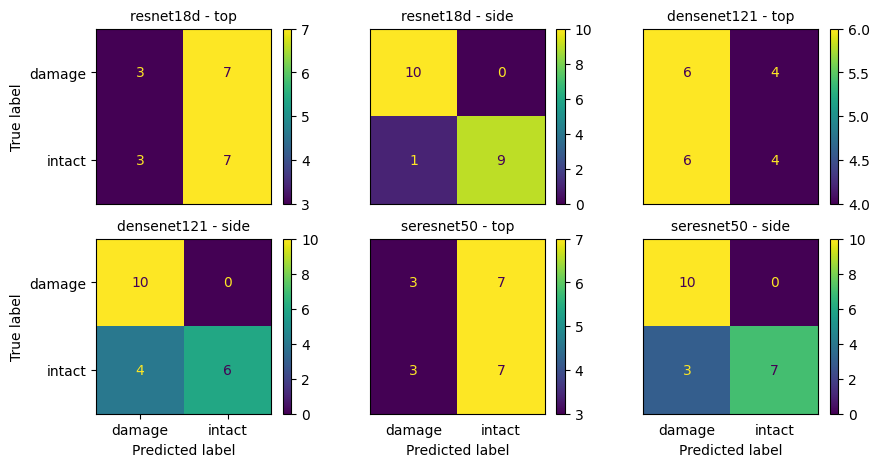

In [ ]:
lista_fig_cm = []

labels_cm = test_side_dataset.class_to_idx.keys()

print(len(lista_evaluation['summary']))

# ConfusionMatrixDisplay(lista_evaluation['conf_matrix'][indice]).plot()
f, axes = plt.subplots(2,3, figsize=(10,5))

for indice in range(len(lista_evaluation['summary'])):
  modelo = ''
  if lista_evaluation['summary'][indice] == model_01_name:
    modelo = model_01_name
  elif lista_evaluation['summary'][indice] == model_02_name:
    modelo = model_02_name
  elif lista_evaluation['summary'][indice] == model_03_name:
    modelo = model_03_name

  top_side = lista_evaluation['top_side'][indice]
  nome_summary = f'{modelo} - {top_side}'

  if indice < 3:
    linha = 0
    coluna = indice
  else:
    linha = 1
    coluna = indice - 3

  axes[linha,coluna].set_title(nome_summary, size=10)
  disp = ConfusionMatrixDisplay(lista_evaluation['conf_matrix'][indice], display_labels=labels_cm)
  disp.plot(include_values=True, ax = axes[linha,coluna])

  if indice < 3:
    axes[linha,coluna].set_xlabel('')
    axes[linha,coluna].xaxis.set_ticklabels(['',''])
    axes[linha,coluna].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

  if indice != 0 and indice != 3:
    axes[linha,coluna].set_ylabel('')
    axes[linha,coluna].yaxis.set_ticklabels(['',''])
    axes[linha,coluna].tick_params(axis='both', which='both', bottom=False, left=False)


  for labels in disp.text_.ravel():
    labels.set_fontsize(10)

plt.show()



##QUESTÃO 02 - CONSLUSÕES

- Observa-se que os modelos 01 e 03 foram os que apresentaram um melhor resultado para a classificação dos dados, obtendo maior valor de acurácia e de F1 na etapa de avaliação, tendo uma maior facilidade de identificar elementos de posição `side`aos elementos de posição `top`;
- Ademais, estes aspectos são corroborados pela matriz de confusão.
  - Observa-se que as melhores matrizes foram encontradas para os elementos de posição `side`.
    - Nestes casos, os modelos 01 e 03 apresentaram os melhores resultados.
    - Os modelos apresentaram maior dificuldade de acertar na previsão dos elementos de label `intact`, classificando, errôneamente alguns deles como `damage`.
- Nenhum dos três modelos apresentou bons resultados para classificação das imagens com posicionamento `top`
  - Os três modelos apresentaram baixa acurácia, próxima de 0.5, e uma matriz de confusão que demonstrou a dificuldade na hora da classificação. Sempre contendo uma quantidade significativa de imagens prevista na classe errada.
    - Os modelos 01 e 03 erraram seguindo o mesmo padrão, classificando mais elementos que eram do tipo `damage`como `intact`, enquanto que para o modelo 02 foi o contrário.

#3. Interpretabilidade

QUESTÃO:
- Utilizar o método de Integrated Gradients para calcular
a matriz de atribuição (ou mapa de interpretação) dos
modelos em relação às imagens. Isso ajudará a
identificar as regiões das imagens (por exemplo,
bounding boxes) que mais influenciaram a decisão do
modelo.
  - O que considerar: Existe consistência entre os
resultados? Definir um limiar para determinar o
que é considerado "importante"?

CONSIDERAÇÕES:
- Para o mapa de interpretabilidade, considerou-se como relevante analisar, para os diferentes modelos, as regiões das imagens que mais influenciam para a classificação destas e sua relação com o BOUND-BOX que temos como referência;
- A ideia, então, é analisar se para cada um dos diferentes mapas de interpretabilidade o bound-box coincide com a região que possui uma maior influência para classificação.
- Considera-se então, que o modelo foi mais importante/relevante quando houve coincidência entre o bound-box e as regiões relevantes do mapa de interpretabilidade

##Importar bibliotecas e analisar, novamente, quantas e quais imagens existem no conjunto de teste

In [ ]:
! pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.5 MB/s eta 0:00:00


In [ ]:
!pip install xmltodict

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from PIL import Image

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

import xmltodict

from captum.attr import IntegratedGradients
import seaborn as sns


warnings.filterwarnings("ignore")

1.Analisando a existência das imagens para em seguida aplicar a interpretabilidade:

In [ ]:
print(f'Qnt de arquivos na pasta damage TOP completa (test): {len(lista_test_damage_top)}.')
print(f'Lista damage completa: {lista_test_damage_top}')
print()
print(f'Qnt de arquivos na pasta intact TOP completa (test): {len(lista_test_intact_top)}.')
print(f'Lista intact completa: {lista_test_intact_top}')
print()
print(f'Qnt de arquivos na pasta damage SIDE completa (test): {len(lista_test_damage_side)}.')
print(f'Lista damage completa: {lista_test_damage_side}')
print()
print(f'Qnt de arquivos na pasta intact SIDE completa (test): {len(lista_test_intact_side)}.')
print(f'Lista intact completa: {lista_test_intact_side}')

Qnt de arquivos na pasta damage TOP completa (test): 10.
Lista damage completa: ['0101069901524_top.png', '0105413725474_top.png', '0118055224146_top.png', '0109451226527_top.png', '0111632059302_top.png', '0123374171704_top.png', '0120928945494_top.png', '0122691608037_top.png', '0163723873967_top.png', '0129768769736_top.png']

Qnt de arquivos na pasta intact TOP completa (test): 10.
Lista intact completa: ['0142348799278_top.png', '0121190978716_top.png', '0144714371478_top.png', '0137037404616_top.png', '0203951267320_top.png', '0240078925171_top.png', '0198143165548_top.png', '0167581056939_top.png', '0193944747528_top.png', '0204572690665_top.png']

Qnt de arquivos na pasta damage SIDE completa (test): 10.
Lista damage completa: ['0118055224146_side.png', '0111632059302_side.png', '0123374171704_side.png', '0120928945494_side.png', '0105413725474_side.png', '0109451226527_side.png', '0101069901524_side.png', '0163723873967_side.png', '0129768769736_side.png', '0122691608037_side.

##Extrair Bound-Box das imagens teste e redimensioná-los para o tamanho da imagem alvo utilizada neste arquivo

###Extraíndo Bound-Box de arquivo .XML existente

In [ ]:
def lista_caminho_img(caminho_pasta,lista_nome_img):
  nova_lista = []
  for img in lista_nome_img:
    path_img = f'{caminho_pasta}/{img}'
    nova_lista.append(path_img)
  return nova_lista

def listar_arquivos_xml(caminho_pasta):
  lista = []
  for root,dirs, files in os.walk(caminho_pasta):
    for file in files:
      if file[-1] == 'l': #puxa somente os arquivos xml
        lista.append(file)
  return lista

In [ ]:
def lista_bound_box(path_bound_box_xml):
  lista_completa_bound_box = []
  lista_xml_bound_box = listar_arquivos_xml(path_bound_box_xml)

  for xml_file_path in lista_xml_bound_box:

    xml_dict = {'label':None,
                'png_label':None,
                'height': None,
                'width': None,
                'xmin':None,
                'xmax':None,
                'ymin':None,
                'ymax':None,
                }

    #ADICIONAR NOME DA IMAGEM png
    nome_raiz = xml_file_path[:-3]
    nome_png = f'{nome_raiz}png'
    xml_dict['png_label'] = nome_png

    path_arquivo_completo = f'{path_bound_box_xml}/{xml_file_path}'

    with open(path_arquivo_completo, 'rb') as xml_file:
      xml_data = xmltodict.parse(xml_file)

    # Extract information from the parsed XML data
    annotation = xml_data['annotation']
    size = annotation['size']
    xml_dict['width'] = int(size['width'])
    xml_dict['height'] = int(size['height'])

    objects = annotation['object']
    if not isinstance(objects, list):
        objects = [objects]  # Handling the case of a single object
    for obj in objects:
        xml_dict['label'] = obj['name']
        bbox = obj['bndbox']
        xml_dict['xmin'] = int(bbox['xmin'])
        xml_dict['ymin'] = int(bbox['ymin'])
        xml_dict['xmax'] = int(bbox['xmax'])
        xml_dict['ymax'] = int(bbox['ymax'])

    lista_completa_bound_box.append(xml_dict)
  return lista_completa_bound_box

In [ ]:
lista_img_path_test_top_damage = lista_caminho_img(test_top_damage,lista_test_damage_top)
lista_img_path_test_top_intact = lista_caminho_img(test_top_intact,lista_test_intact_top)
lista_img_path_test_side_damage = lista_caminho_img(test_side_damage,lista_test_damage_side)
lista_img_path_test_side_intact = lista_caminho_img(test_side_intact,lista_test_intact_side)


In [ ]:
path_bound_box_damage_top_xml = damage_test_top_original_dir
path_bound_box_intact_top_xml = intact_test_top_original_dir
path_bound_box_damage_side_xml = damage_test_side_original_dir
path_bound_box_intact_side_xml = intact_test_side_original_dir

In [ ]:
list_boundbox_damage_top = lista_bound_box(path_bound_box_damage_top_xml)
list_boundbox_intact_top = lista_bound_box(path_bound_box_intact_top_xml)
list_boundbox_damage_side = lista_bound_box(path_bound_box_damage_side_xml)
list_boundbox_intact_side = lista_bound_box(path_bound_box_intact_side_xml)

In [ ]:
for elemento in list_boundbox_damage_top:
  print(elemento)

{'label': 'damaged', 'png_label': '0101069901524_top.png', 'height': 540, 'width': 960, 'xmin': 307, 'xmax': 591, 'ymin': 242, 'ymax': 320}
{'label': 'damaged', 'png_label': '0118055224146_top.png', 'height': 540, 'width': 960, 'xmin': 284, 'xmax': 575, 'ymin': 184, 'ymax': 318}
{'label': 'damaged', 'png_label': '0109451226527_top.png', 'height': 540, 'width': 960, 'xmin': 310, 'xmax': 611, 'ymin': 55, 'ymax': 145}
{'label': 'damaged', 'png_label': '0122691608037_top.png', 'height': 540, 'width': 960, 'xmin': 341, 'xmax': 643, 'ymin': 159, 'ymax': 295}
{'label': 'damaged', 'png_label': '0123374171704_top.png', 'height': 540, 'width': 960, 'xmin': 294, 'xmax': 586, 'ymin': 214, 'ymax': 310}
{'label': 'damaged', 'png_label': '0163723873967_top.png', 'height': 540, 'width': 960, 'xmin': 414, 'xmax': 541, 'ymin': 51, 'ymax': 194}
{'label': 'damaged', 'png_label': '0129768769736_top.png', 'height': 540, 'width': 960, 'xmin': 391, 'xmax': 658, 'ymin': 131, 'ymax': 220}
{'label': 'damaged', '

###Redimensionando Bound-Box

In [ ]:
def resizing_bound_box(new_width,new_height,lista_bound_box):
  new_lista_bound_box = []

  for elemento in lista_bound_box:
    xml_dict = {'label':None,
                'png_label':None,
                'height': None,
                'width': None,
                'xmin':None,
                'xmax':None,
                'ymin':None,
                'ymax':None,
                }
    xml_dict['label'] = elemento['label']
    xml_dict['png_label'] = elemento['png_label']
    xml_dict['height'] = new_height
    xml_dict['width'] = new_width

    scaling_factor_width = new_width / elemento['width']
    scaling_factor_height = new_height / elemento['height']

    xml_dict['xmin'] = round(scaling_factor_width * elemento['xmin'],2)
    xml_dict['xmax'] = round(scaling_factor_width * elemento['xmax'],2)
    xml_dict['ymin'] = round(scaling_factor_height * elemento['ymin'],2)
    xml_dict['ymax'] = round(scaling_factor_height * elemento['ymax'],2)

    new_lista_bound_box.append(xml_dict)
  return new_lista_bound_box

In [ ]:
new_list_boundbox_damage_top = resizing_bound_box(224,224,list_boundbox_damage_top)
new_list_boundbox_intact_top = resizing_bound_box(224,224,list_boundbox_intact_top)
new_list_boundbox_damage_side = resizing_bound_box(224,224,list_boundbox_damage_side)
new_list_boundbox_intact_side = resizing_bound_box(224,224,list_boundbox_intact_side)

In [ ]:
for elemento in new_list_boundbox_damage_top:
  print(elemento)

{'label': 'damaged', 'png_label': '0101069901524_top.png', 'height': 224, 'width': 224, 'xmin': 71.63, 'xmax': 137.9, 'ymin': 100.39, 'ymax': 132.74}
{'label': 'damaged', 'png_label': '0118055224146_top.png', 'height': 224, 'width': 224, 'xmin': 66.27, 'xmax': 134.17, 'ymin': 76.33, 'ymax': 131.91}
{'label': 'damaged', 'png_label': '0109451226527_top.png', 'height': 224, 'width': 224, 'xmin': 72.33, 'xmax': 142.57, 'ymin': 22.81, 'ymax': 60.15}
{'label': 'damaged', 'png_label': '0122691608037_top.png', 'height': 224, 'width': 224, 'xmin': 79.57, 'xmax': 150.03, 'ymin': 65.96, 'ymax': 122.37}
{'label': 'damaged', 'png_label': '0123374171704_top.png', 'height': 224, 'width': 224, 'xmin': 68.6, 'xmax': 136.73, 'ymin': 88.77, 'ymax': 128.59}
{'label': 'damaged', 'png_label': '0163723873967_top.png', 'height': 224, 'width': 224, 'xmin': 96.6, 'xmax': 126.23, 'ymin': 21.16, 'ymax': 80.47}
{'label': 'damaged', 'png_label': '0129768769736_top.png', 'height': 224, 'width': 224, 'xmin': 91.23, '

##Utilizar Integrated Gradients para aplicar Interpretabilidade

1.Criação de um transformador de img para o mapa de calor neste caso, ele será igual ao utilizado no conjunto de teste no desenvolvimento dos modelos de avaliação

In [ ]:
data_test_heatmap = transforms.Compose([
    transforms.Resize((224, 224)),     # Resize the image to (224, 224)
    transforms.ToTensor(),             # Convert image to tensor
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
        ),
    ])

2.Ajuste de parâmetros da Função ReLu para aplicar corretamente o `Integrated Gradients`

In [ ]:
def ReLU_inplace_to_False(module):
    for layer in module._modules.values():
        if isinstance(layer, nn.ReLU):
            layer.inplace = False
        ReLU_inplace_to_False(layer)

In [ ]:
#setando a <inplace> para False
ReLU_inplace_to_False(model_01)
ReLU_inplace_to_False(model_02)
ReLU_inplace_to_False(model_03)

3.Criação e aplicação de uma função que cria um mapas de calor, aplicando Integrated Gradients, através de uma lista de imagens

In [ ]:
def integrated_gradients_img(modelo,lista_img_path,lista_nome_img):
  modelo.cpu()
  modelo.eval()

  nome_img = ''

  heatmaps = {}

  for path in lista_img_path:

    for nome in lista_nome_img:
      if path.find(nome) != -1:
        nome_img = nome

    img = Image.open(path)

    x = data_test_heatmap(img).unsqueeze(0)
    x.requires_grad = True
    #aplicação do modelo na imagem para pegar a previsão dele
    pred_resnet = modelo(x)

    #argumentos máximos
    y_resnet  = pred_resnet.argmax()

    #imagem normalizada pré-processada
    x_show = data_test_heatmap(img).permute(1, 2, 0)

    modelo.zero_grad()

    baseline_shape = (1, 3, 224, 224)

    ig = IntegratedGradients(
        modelo,
        multiply_by_inputs=False
        )

    #base line vai ser um torch de zero da mesma dimensão do
    #base line escolhido.
    #o <n_steps> é a quantidade de pontos que ele vai extrair da linha.
    #ele gera uma imagem para cada n_step. Por padrão ele junta todas as
    #imagens e cria uma só. Se colocar um valor muito alto isso pode vir a
    #dar um erro. Existe um parâmetro que separa estes valores em batch e diminui o tamanho
    #da GPU a ser utilizada.
    out = ig.attribute(
        x,
        baselines=torch.zeros(baseline_shape),
        target=y_resnet.cpu(),
        n_steps=20
        )

    out = out.detach().squeeze().permute(1, 2, 0).numpy()

    heatmaps[nome_img] = out
  return heatmaps


In [ ]:
index = 0

for i in range(len(summary_load_list)):
  print(summary_load_list[i]['summary_path'])

summary_top_resnet18d.pth
summary_side_resnet18d.pth
summary_top_densenet121.pth
summary_side_densenet121.pth
summary_top_seresnet50.pth
summary_side_seresnet50.pth


In [ ]:
#model_01 images
#images TOP:
model_01.load_state_dict(summary_load_list[0]['model_state'])
heatmaps_model_01_top_damage = integrated_gradients_img(model_01,lista_img_path_test_top_damage,lista_test_damage_top)
heatmaps_model_01_top_intact = integrated_gradients_img(model_01,lista_img_path_test_top_intact,lista_test_intact_top)

#images SIDE:
model_01.load_state_dict(summary_load_list[1]['model_state'])
heatmaps_model_01_side_damage = integrated_gradients_img(model_01,lista_img_path_test_side_damage,lista_test_damage_side)
heatmaps_model_01_side_intact = integrated_gradients_img(model_01,lista_img_path_test_side_intact,lista_test_intact_side)

In [ ]:
#model_02 images
#images TOP:
model_02.load_state_dict(summary_load_list[2]['model_state'])
heatmaps_model_02_top_damage = integrated_gradients_img(model_02,lista_img_path_test_top_damage,lista_test_damage_top)
heatmaps_model_02_top_intact = integrated_gradients_img(model_02,lista_img_path_test_top_intact,lista_test_intact_top)

#images SIDE:
model_02.load_state_dict(summary_load_list[3]['model_state'])
heatmaps_model_02_side_damage = integrated_gradients_img(model_02,lista_img_path_test_side_damage,lista_test_damage_side)
heatmaps_model_02_side_intact = integrated_gradients_img(model_02,lista_img_path_test_side_intact,lista_test_intact_side)

In [ ]:
#model_03 images
#images TOP:
model_03.load_state_dict(summary_load_list[4]['model_state'])
heatmaps_model_03_top_damage = integrated_gradients_img(model_03,lista_img_path_test_top_damage,lista_test_damage_top)
heatmaps_model_03_top_intact = integrated_gradients_img(model_03,lista_img_path_test_top_intact,lista_test_intact_top)

#images SIDE:
model_03.load_state_dict(summary_load_list[5]['model_state'])
heatmaps_model_03_side_damage = integrated_gradients_img(model_03,lista_img_path_test_side_damage,lista_test_damage_side)
heatmaps_model_03_side_intact = integrated_gradients_img(model_03,lista_img_path_test_side_intact,lista_test_intact_side)

##Apresentação dos mapas de interpretação

In [ ]:
def mapa_interpretabilidade(heatmaps,lista_bound_box):
  fig, axs = plt.subplots(1, len(heatmaps.keys()), figsize=(35, 5))

  xmin = 0
  xmax= 0
  ymin = 0
  ymax = 0

  for i, key in enumerate(heatmaps.keys()):

    for index in range(len(lista_bound_box)):
      if key == lista_bound_box[index]['png_label']:
        xmin = lista_bound_box[index]['xmin']
        xmax = lista_bound_box[index]['xmax']
        ymin = lista_bound_box[index]['ymin']
        ymax = lista_bound_box[index]['ymax']

    rect = Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),fill=False,edgecolor='darkred',lw=5)

    sns.heatmap(np.abs(heatmaps[key]).sum(2) if len(heatmaps[key].shape) == 3 else np.abs(heatmaps[key]), ax=axs[i], cmap="plasma")
    axs[i].set_title(key)
    axs[i].add_patch(rect)

  fig.tight_layout()
  plt.show()

In [ ]:
def plot_img_original(lista_img_path,lista_nome_img,lista_bound_box):
  i = 0
  fig, axs = plt.subplots(1, len(lista_img_path), figsize=(35, 5))

  nome_img = ''
  xmin = 0
  xmax= 0
  ymin = 0
  ymax = 0

  for path in lista_img_path:
    for nome in lista_nome_img:
      if path.find(nome) != -1:
        nome_img = nome

    for index in range(len(lista_bound_box)):
      if nome_img == lista_bound_box[index]['png_label']:
        xmin = lista_bound_box[index]['xmin']
        xmax = lista_bound_box[index]['xmax']
        ymin = lista_bound_box[index]['ymin']
        ymax = lista_bound_box[index]['ymax']

    rect = Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),fill=False,edgecolor='darkred',lw=5)

    img = Image.open(path)
    x_show = data_test_heatmap(img).permute(1, 2, 0)
    # sns.heatmap(x_show.numpy(), ax=axs[i], cmap="plasma")
    axs[i].imshow(x_show.numpy())
    axs[i].set_title(nome_img)
    axs[i].add_patch(rect)
    i += 1
  fig.tight_layout()
  plt.show()

Os mapas de interpretabilidade serão apresentados em quatro grupos diferentes:
- Imagens com visão TOP e label DAMAGE
- Imagens com visão TOP e label INTACT
- Imagens com visão SIDE e label DAMAGE
- Imagens com visão SIDE e label INTACT

Para cada um desses quatro grupos, cada uma das imagens será apresentada em quatro sub-grupos, sendo eles:
- Imagem original
- Modelo 01
- Modelo 02
- Modelo 03

Importante ressaltar que cada um desses sub-grupos será apresentado em uma única linha e a apresentação das imagens seguirá a mesma ordem. Em suma, cada imagem será apresentada em diferentes versões uma embaixo da outra.

###TEST - TOP - DAMAGE

1.Apresentação imagens originais com bound-box

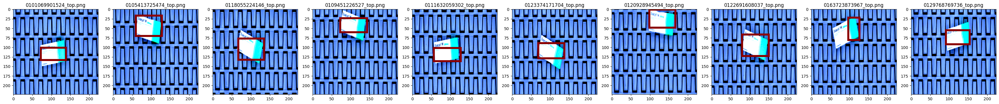

In [ ]:
plot_img_original(lista_img_path_test_top_damage,lista_test_damage_top,new_list_boundbox_damage_top)

2.Apresentação imagens interpretabilidade, Modelo 01, com bound-box

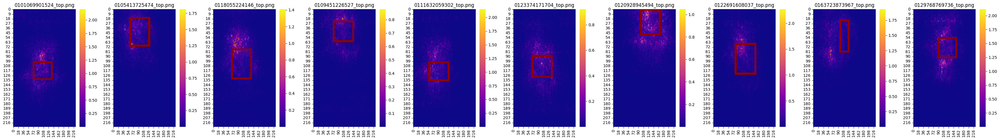

In [ ]:
mapa_interpretabilidade(heatmaps_model_01_top_damage,new_list_boundbox_damage_top)

3.Apresentação imagens interpretabilidade, Modelo 02, com bound-box

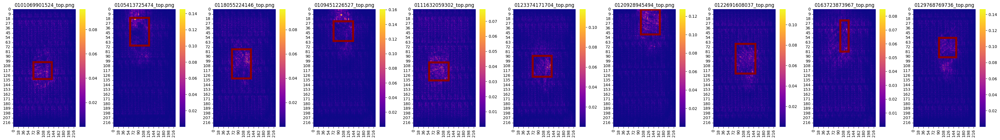

In [ ]:
mapa_interpretabilidade(heatmaps_model_02_top_damage,new_list_boundbox_damage_top)

4.Apresentação imagens interpretabilidade, Modelo 03, com bound-box

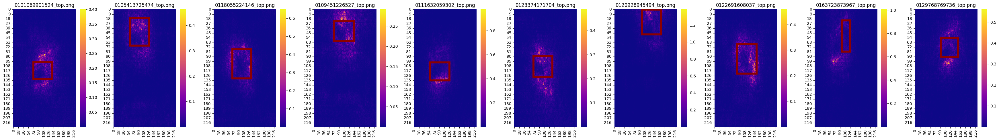

In [ ]:
mapa_interpretabilidade(heatmaps_model_03_top_damage,new_list_boundbox_damage_top)

###TEST - TOP - INTACT

1.Apresentação imagens originais com bound-box

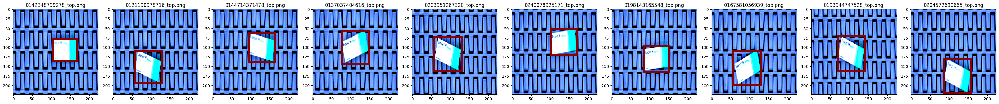

In [ ]:
plot_img_original(lista_img_path_test_top_intact,lista_test_intact_top,new_list_boundbox_intact_top)

2.Apresentação imagens interpretabilidade, Modelo 01, com bound-box

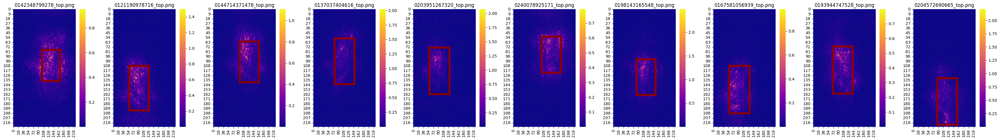

In [ ]:
mapa_interpretabilidade(heatmaps_model_01_top_intact,new_list_boundbox_intact_top)

3.Apresentação imagens interpretabilidade, Modelo 02, com bound-box

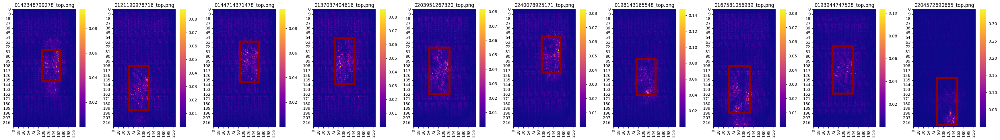

In [ ]:
mapa_interpretabilidade(heatmaps_model_02_top_intact,new_list_boundbox_intact_top)

4.Apresentação imagens interpretabilidade, Modelo 03, com bound-box

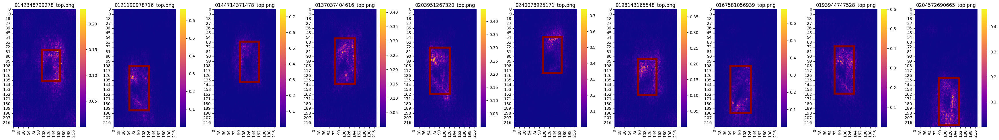

In [ ]:
mapa_interpretabilidade(heatmaps_model_03_top_intact,new_list_boundbox_intact_top)

###TEST - SIDE - DAMAGE

1.Apresentação imagens originais com bound-box

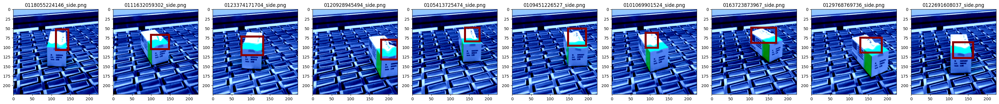

In [ ]:
plot_img_original(lista_img_path_test_side_damage,lista_test_damage_side,new_list_boundbox_damage_side)

2.Apresentação imagens interpretabilidade, Modelo 01, com bound-box

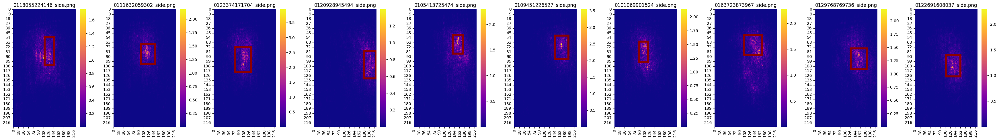

In [ ]:
mapa_interpretabilidade(heatmaps_model_01_side_damage,new_list_boundbox_damage_side)

3.Apresentação imagens interpretabilidade, Modelo 02, com bound-box

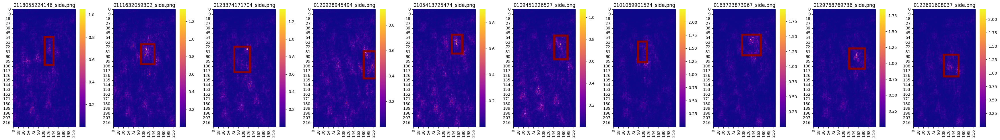

In [ ]:
mapa_interpretabilidade(heatmaps_model_02_side_damage,new_list_boundbox_damage_side)

4.Apresentação imagens interpretabilidade, Modelo 03, com bound-box

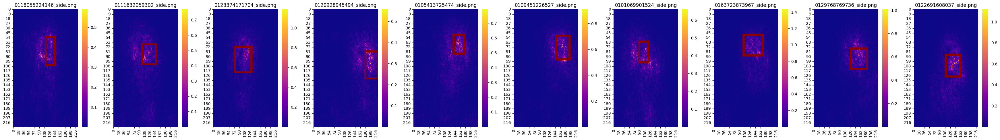

In [ ]:
mapa_interpretabilidade(heatmaps_model_03_side_damage,new_list_boundbox_damage_side)

###TEST - SIDE - INTACT

1.Apresentação imagens originais com bound-box

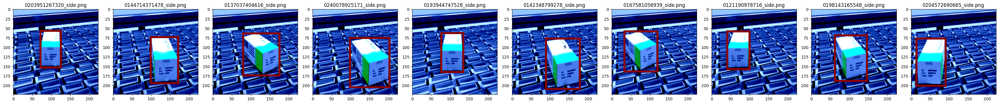

In [ ]:
plot_img_original(lista_img_path_test_side_intact,lista_test_intact_side,new_list_boundbox_intact_side)

2.Apresentação imagens interpretabilidade, Modelo 01, com bound-box

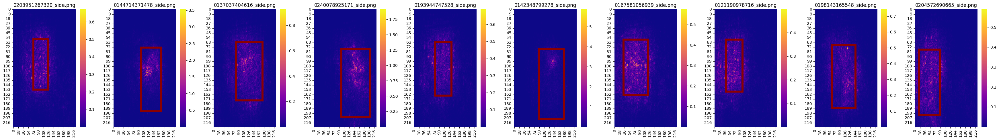

In [ ]:
mapa_interpretabilidade(heatmaps_model_01_side_intact,new_list_boundbox_intact_side)

3.Apresentação imagens interpretabilidade, Modelo 02, com bound-box

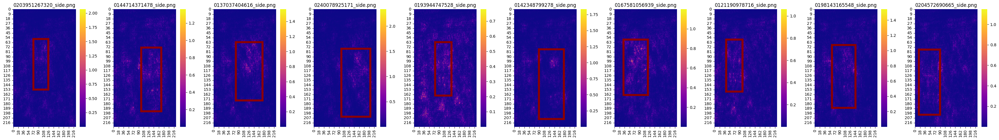

In [ ]:
mapa_interpretabilidade(heatmaps_model_02_side_intact,new_list_boundbox_intact_side)

4.Apresentação imagens interpretabilidade, Modelo 03, com bound-box

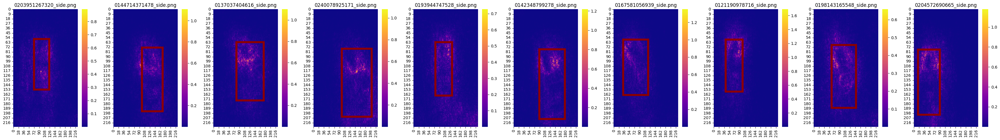

In [ ]:
mapa_interpretabilidade(heatmaps_model_03_side_intact,new_list_boundbox_intact_side)

##QUESTÃO 03 - CONSLUSÕES

- O limiar para consideração do que é importante, como mencionado anteriormente, foi o Bound-Box existente para cada uma das imagens teste.
- Existe uma consistência entre os resultados:
  - Indepentende do modelo, o programa teve mais dificuldade de idenficiar a região de interesse quando a imagem era do tipo `DAMAGAE - TOP`;
  - Entretando, nos casos `INTACT - TOP`, as regiões de maior influência nos mapas de interpretabilidade se aproximaram mais do bound-box, porém tiveram muitos casos em que foram indentificadas extensas regiões de interesse que estravam além do bound-box
  - No caso das imagens de label `SIDE`, em todos os modelos, foi possível que a região de maior importância se aproximasse mais do bound-box nos casos em que a caixa estava danificada, label `DAMAGE`


#4. Comparação dos Mapas de Interpretação

##Questão

- Comparar os mapas de interpretação gerados por cada
arquitetura a partir da tarefa anterior. O objetivo é
verificar o quanto de importância cada modelo atribui
aos pixels que efetivamente representam a região
danificada nos pacotes.
  - O que considerar: Quais métricas de similaridade?
Algo interessante nos erros? Existe consistência
nos resultados? Como os insights dos mapas
podem ser aplicados?

##QUESTÃO 04 - CONSLUSÕES

- Observou-se uma similaridade entre os modelos apresentados, em que a região de interesse dos mapas se aproxima mais do bound-box nos casos em que a imagem está danificada, enquanto que na imagem intacta a região de interesse tem uma espacialização a mais com relação ao bound-box.
- Os modelos foram consistentes na hora de apresentar os resultados, indepentente das labels(`damage ou intact`) ou do lado visto (`top ou side`). Enquanto que os modelos 01 e 03 (`ResNet18 e Se-ResNet50, respectivamente`)conseguiram identificar melhor a região de interesse, encaixando-a melhor no bound-box, o modelo 02(`DenseNet121`) apresentou o pior resultado.
- Um erro que se apresentou frequente em todos os modelos e até mesmo na variação de side, top, foi a influência da imagem de fundo, porém, em alguns com uma influência maior que outra. Muitas vezes o programa identificou uma região de interesse fora do bound-box muito forte, apontando que ele estava dando certa importância para o fundo da imagem e não somente para a caixa, como deveria ser o ideal.
- Estes mapas podem ser aplicados para gerar um novo teste do modelo no futuro, com algumas modificações:
  - Neste teste pode ser feita a exclusão do fundo das imagens, antes de gerar o treinamento do modelo, para que eles não venham a influenciar nova na região de decisão da imagem.
  - Ademais, pode-se utilizar o augmentation para aumentar a quantidade de imagens do tipo `intact` visto que esta foi a label mais difícil de classificar.

#ANÁLISE FINAL DA ATIVIDADE

TEXTO

In [ ]:
# import IPython
# app = IPython.Application.instance()
# app.kernel.do_shutdown(True)